In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 99.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.9 MB/s eta 0:00:00


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import os
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
model_path = "/content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/weights/best.pt"

In [5]:
model = YOLO(model_path)

In [6]:
result = model.predict("/content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/test/images/20220327_0107_jpg.rf.77d3c13fa2e89a8237f882125e1e75f0.jpg", conf=0.5)


image 1/1 /content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/test/images/20220327_0107_jpg.rf.77d3c13fa2e89a8237f882125e1e75f0.jpg: 640x640 54 Damageds, 656.9ms
Speed: 10.5ms preprocess, 656.9ms inference, 35.0ms postprocess per image at shape (1, 3, 640, 640)


In [7]:
result

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Bad', 1: 'Damaged', 2: 'Good'}
 obb: None
 orig_img: array([[[137, 129, 122],
         [127, 119, 112],
         [119, 111, 104],
         ...,
         [126, 116, 109],
         [126, 116, 109],
         [126, 116, 109]],
 
        [[137, 129, 122],
         [127, 119, 112],
         [119, 111, 104],
         ...,
         [126, 116, 109],
         [126, 116, 109],
         [126, 116, 109]],
 
        [[137, 129, 122],
         [127, 119, 112],
         [119, 111, 104],
         ...,
         [126, 116, 109],
         [126, 116, 109],
         [126, 116, 109]],
 
        ...,
 
        [[ 97,  98,  96],
         [ 97,  98,  96],
         [ 97,  98,  96],
         ...,
         [ 44,  55,  85],
         [ 40,  53,  85],
         [ 37,  50,  82]],
 
        [[ 95,  96,  94],
         [ 95,  96,  94],
         [ 95,  96,  94],
         .

Label Distribution:
Bad: 0.00%
Damaged: 100.00%
Good: 0.00%


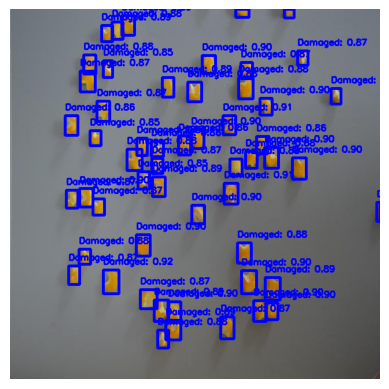

In [8]:
import collections

# Function to draw custom annotations
def custom_annotate_image(image, boxes, names, colors=None, show_labels=True):
    annotated_img = image.copy()
    for box in boxes:
        x1, y1, x2, y2 = [int(i) for i in box.xyxy[0]]
        label_id = int(box.cls[0])
        label_name = names[label_id]
        confidence = float(box.conf[0])

        # Choose color based on label or use a default color
        color = colors.get(label_id, (255, 0, 0)) if colors else (255, 0, 0)

        # Draw bounding box
        cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 4)

        # Add label and confidence
        if show_labels:
            label = f"{label_name}: {confidence:.2f}"
            cv2.putText(annotated_img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return annotated_img

# Define custom colors for each label (optional) {0: 'Bad', 1: 'Damaged', 2: 'Good'}
custom_colors = {
    0: (0, 0, 255),  # Red for 'bad'
    1: (255, 0, 0),  # Blue for 'Damaged'
    2: (0, 255, 0)   # Green for 'Good'
}

# Use the custom annotation function
annotated_image = custom_annotate_image(result[0].orig_img, result[0].boxes, result[0].names, colors=custom_colors, show_labels=True)

# Convert BGR to RGB for matplotlib display
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Get the predicted labels
labels = result[0].boxes.cls.tolist()
label_names = result[0].names

# Count the occurrences of each label
label_counts = collections.Counter(labels)

# Calculate percentages and prepare report
total_labels = len(labels)
report_lines = ["Label Distribution:"]
for label_id in sorted(label_names.keys()): # Iterate through all possible labels
    count = label_counts.get(label_id, 0) # Get count, default to 0 if label not present
    percentage = (count / total_labels) * 100 if total_labels > 0 else 0
    report_lines.append(f"{label_names[label_id]}: {percentage:.2f}%")

# Print the report
print("\n".join(report_lines))

# Display the image
plt.imshow(annotated_image_rgb)
plt.axis('off')

plt.show()

In [9]:
import collections

# Function to draw custom annotations
def custom_annotate_image(image, boxes, names, colors=None, show_labels=True):
    annotated_img = image.copy()
    for box in boxes:
        x1, y1, x2, y2 = [int(i) for i in box.xyxy[0]]
        label_id = int(box.cls[0])
        label_name = names[label_id]
        confidence = float(box.conf[0])

        # Choose color based on label or use a default color
        color = colors.get(label_id, (255, 0, 0)) if colors else (255, 0, 0)

        # Draw bounding box
        cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)

        # Add label and confidence
        if show_labels:
            label = f"{label_name}: {confidence:.2f}"
            cv2.putText(annotated_img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return annotated_img

# Define custom colors for each label (optional)
custom_colors = {
    0: (0, 0, 255),  # Red for 'bad'
    1: (255, 0, 0),  # Blue for 'Damaged'
    2: (0, 255, 0)   # Green for 'Good'
}

def detect_and_report(image_input, model, custom_colors=None, show_labels=True, return_img=False):
    """
    Performs object detection on an image and reports label percentages and counts.

    Args:
        image_input: Path to the image file or a BGR image array.
        model: The loaded YOLO model.
        custom_colors: Dictionary of custom colors for annotations.
        show_labels: Whether to display labels on the annotated image.
        return_img: If True, returns the annotated image with the report as title.
    """
    if isinstance(image_input, str):
        # If input is a path, read the image
        image = cv2.imread(image_input)
    elif isinstance(image_input, np.ndarray):
        # If input is a numpy array (image), use it directly
        image = image_input
    else:
        raise ValueError("Invalid input type. Please provide an image path or a BGR image array.")

    # Perform detection
    results = model.predict(image)

    # Use the custom annotation function
    annotated_image = custom_annotate_image(image, results[0].boxes, results[0].names, colors=custom_colors, show_labels=show_labels)

    # Convert BGR to RGB for matplotlib display
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

    # Get the predicted labels
    labels = results[0].boxes.cls.tolist()
    label_names = results[0].names

    # Count the occurrences of each label
    label_counts = collections.Counter(labels)

    # Calculate percentages and prepare report
    total_labels = len(labels)
    report_lines = ["Label Distribution:"]
    for label_id in sorted(label_names.keys()): # Iterate through all possible labels
        count = label_counts.get(label_id, 0) # Get count, default to 0 if label not present
        percentage = (count / total_labels) * 100 if total_labels > 0 else 0
        report_lines.append(f"{label_names[label_id]}: {percentage:.2f}% ({count})")

    report_string = "\n".join(report_lines)

    # Print the report
    print(report_string)

    # Display the image
    plt.imshow(annotated_image_rgb)
    plt.axis('off')
    plt.title(report_string) # Set the report as the title
    plt.show()

    if return_img:
        # Create a copy of the annotated image to add the title
        image_with_title = annotated_image.copy()
        # Add the report as text on the image
        y_offset = 30
        for line in report_lines:
            cv2.putText(image_with_title, line, (10, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
            y_offset += 20
        return image_with_title


0: 640x640 56 Damageds, 392.8ms
Speed: 3.8ms preprocess, 392.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (56)
Good: 0.00% (0)


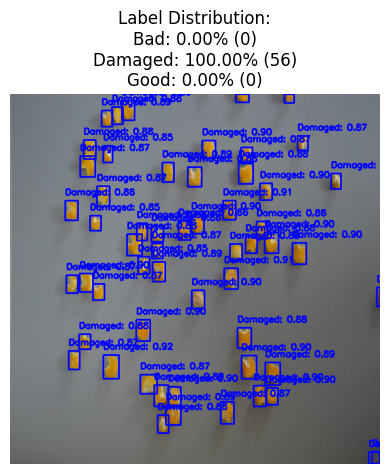

In [10]:
detect_and_report("/content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/test/images/20220327_0107_jpg.rf.77d3c13fa2e89a8237f882125e1e75f0.jpg", model, custom_colors)

In [11]:
from glob import glob
from tqdm import tqdm

In [12]:
test_images_path = "/content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/test/images"
test_images = glob(test_images_path + "/*")

In [13]:
test_images_filtered = [image for image in test_images if "_IM_" not in image]
len(test_images_filtered)

55

Processing Images:   0%|          | 0/55 [00:00<?, ?it/s]


0: 640x640 41 Damageds, 322.4ms
Speed: 7.2ms preprocess, 322.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (41)
Good: 0.00% (0)


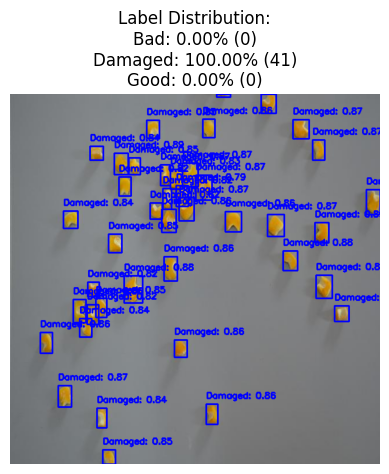

Processing Images:   2%|▏         | 1/55 [00:01<00:57,  1.07s/it]


0: 640x640 56 Damageds, 235.5ms
Speed: 8.1ms preprocess, 235.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (56)
Good: 0.00% (0)


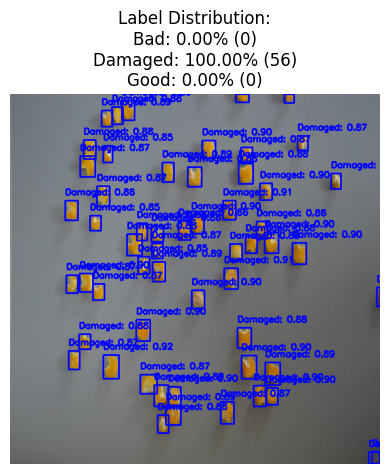

Processing Images:   4%|▎         | 2/55 [00:01<00:45,  1.16it/s]


0: 640x640 62 Bads, 11 Damageds, 49 Goods, 231.2ms
Speed: 6.7ms preprocess, 231.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 50.82% (62)
Damaged: 9.02% (11)
Good: 40.16% (49)


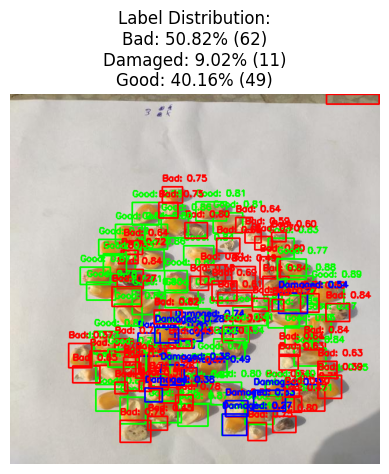

Processing Images:   5%|▌         | 3/55 [00:02<00:49,  1.06it/s]


0: 640x640 35 Damageds, 235.9ms
Speed: 6.0ms preprocess, 235.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (35)
Good: 0.00% (0)


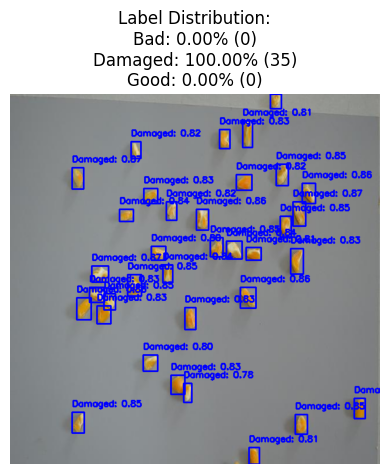

Processing Images:   7%|▋         | 4/55 [00:03<00:49,  1.03it/s]


0: 640x640 39 Damageds, 237.2ms
Speed: 8.3ms preprocess, 237.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (39)
Good: 0.00% (0)


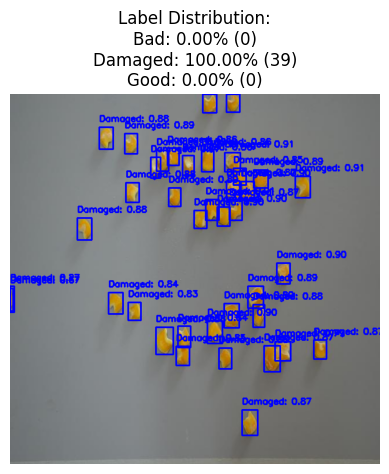

Processing Images:   9%|▉         | 5/55 [00:04<00:46,  1.07it/s]


0: 640x640 1 Bad, 46 Damageds, 231.2ms
Speed: 4.1ms preprocess, 231.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 2.13% (1)
Damaged: 97.87% (46)
Good: 0.00% (0)


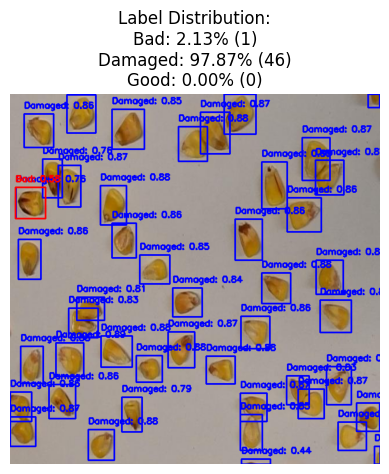

Processing Images:  11%|█         | 6/55 [00:05<00:46,  1.06it/s]


0: 640x640 27 Damageds, 210.4ms
Speed: 5.0ms preprocess, 210.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (27)
Good: 0.00% (0)


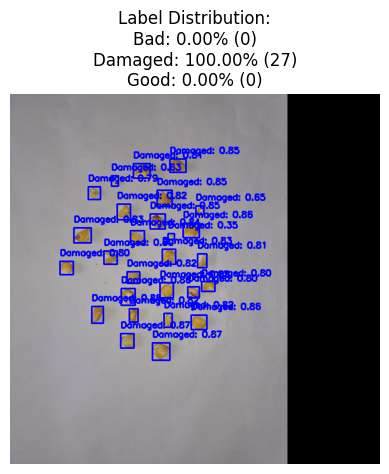

Processing Images:  13%|█▎        | 7/55 [00:06<00:45,  1.05it/s]


0: 640x640 5 Damageds, 214.3ms
Speed: 4.7ms preprocess, 214.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (5)
Good: 0.00% (0)


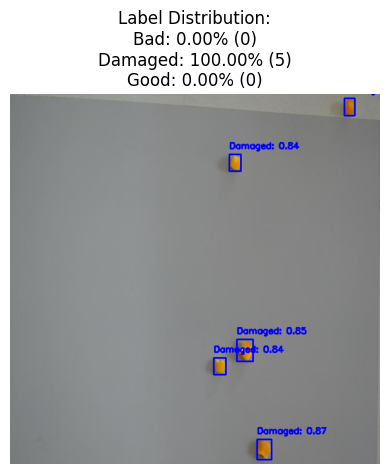

Processing Images:  15%|█▍        | 8/55 [00:07<00:50,  1.08s/it]


0: 640x640 27 Damageds, 283.4ms
Speed: 11.0ms preprocess, 283.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (27)
Good: 0.00% (0)


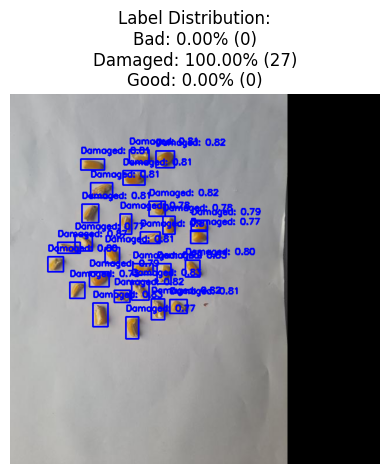

Processing Images:  16%|█▋        | 9/55 [00:09<00:49,  1.07s/it]


0: 640x640 49 Damageds, 233.4ms
Speed: 3.6ms preprocess, 233.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (49)
Good: 0.00% (0)


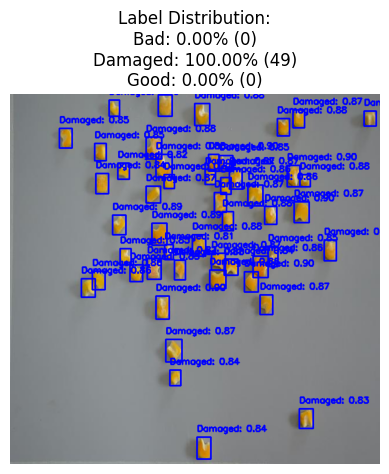

Processing Images:  18%|█▊        | 10/55 [00:10<00:47,  1.05s/it]


0: 640x640 36 Damageds, 319.9ms
Speed: 4.4ms preprocess, 319.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (36)
Good: 0.00% (0)


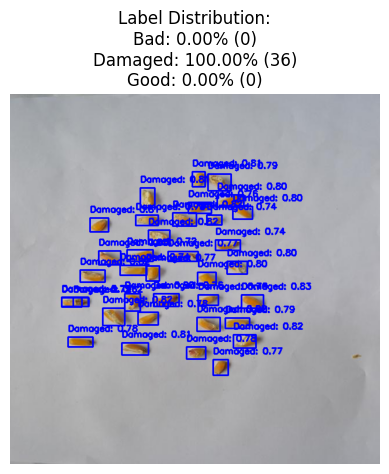

Processing Images:  20%|██        | 11/55 [00:11<00:49,  1.12s/it]


0: 640x640 30 Bads, 397.9ms
Speed: 10.0ms preprocess, 397.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 100.00% (30)
Damaged: 0.00% (0)
Good: 0.00% (0)


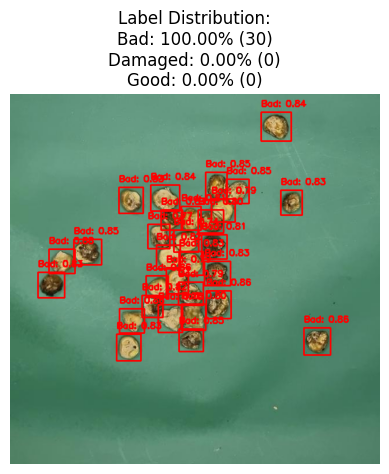

Processing Images:  22%|██▏       | 12/55 [00:12<00:51,  1.21s/it]


0: 640x640 50 Damageds, 369.0ms
Speed: 4.1ms preprocess, 369.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (50)
Good: 0.00% (0)


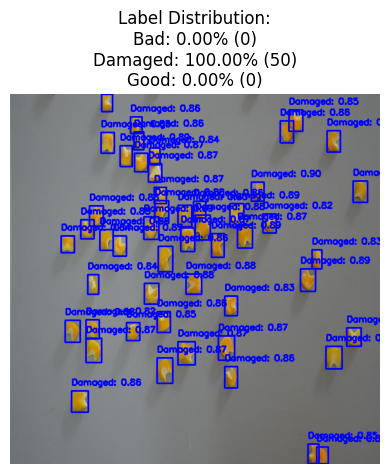

Processing Images:  24%|██▎       | 13/55 [00:14<00:53,  1.26s/it]


0: 640x640 32 Damageds, 247.4ms
Speed: 3.7ms preprocess, 247.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (32)
Good: 0.00% (0)


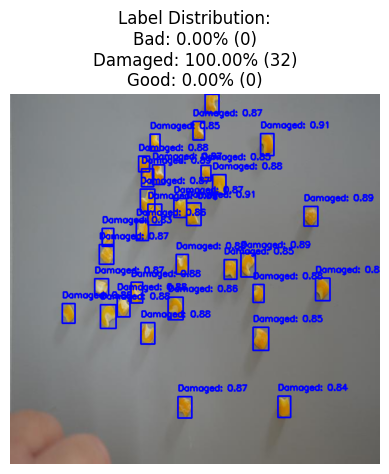

Processing Images:  25%|██▌       | 14/55 [00:15<00:49,  1.20s/it]


0: 640x640 26 Damageds, 252.2ms
Speed: 6.9ms preprocess, 252.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (26)
Good: 0.00% (0)


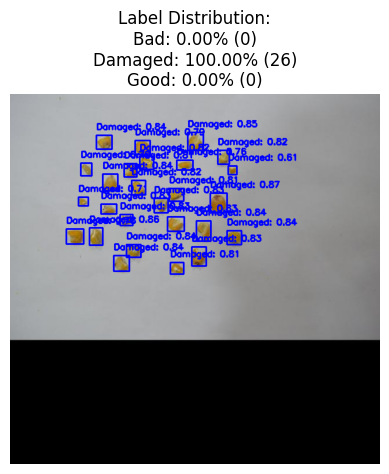

Processing Images:  27%|██▋       | 15/55 [00:16<00:47,  1.18s/it]


0: 640x640 5 Damageds, 1 Good, 242.9ms
Speed: 5.7ms preprocess, 242.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 83.33% (5)
Good: 16.67% (1)


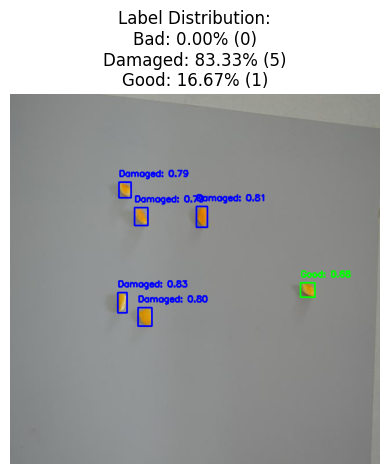

Processing Images:  29%|██▉       | 16/55 [00:17<00:45,  1.16s/it]


0: 640x640 34 Damageds, 231.7ms
Speed: 7.4ms preprocess, 231.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (34)
Good: 0.00% (0)


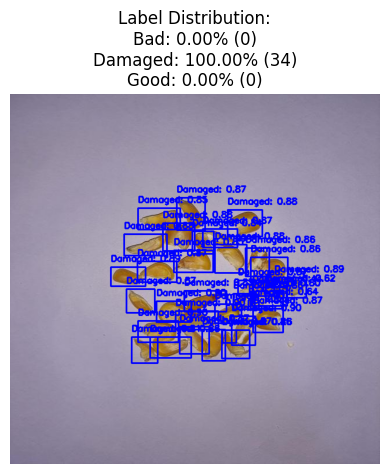

Processing Images:  31%|███       | 17/55 [00:18<00:42,  1.12s/it]


0: 640x640 77 Bads, 17 Damageds, 38 Goods, 239.6ms
Speed: 7.9ms preprocess, 239.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 58.33% (77)
Damaged: 12.88% (17)
Good: 28.79% (38)


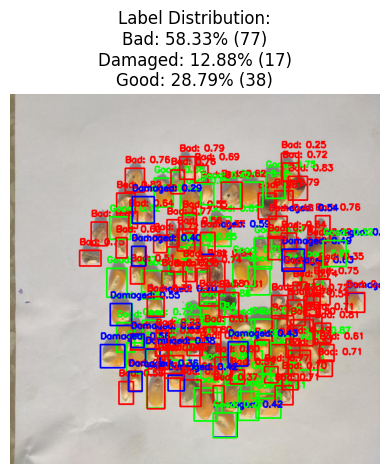

Processing Images:  33%|███▎      | 18/55 [00:19<00:41,  1.13s/it]


0: 640x640 11 Damageds, 2 Goods, 252.4ms
Speed: 9.5ms preprocess, 252.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 84.62% (11)
Good: 15.38% (2)


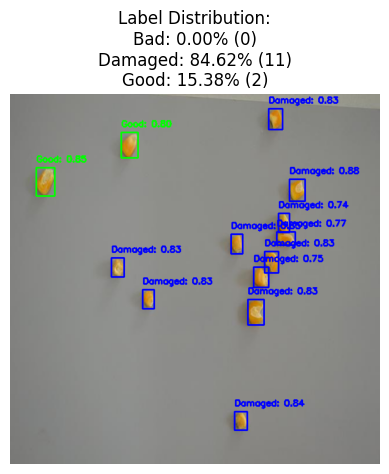

Processing Images:  35%|███▍      | 19/55 [00:20<00:39,  1.11s/it]


0: 640x640 59 Damageds, 242.3ms
Speed: 3.4ms preprocess, 242.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (59)
Good: 0.00% (0)


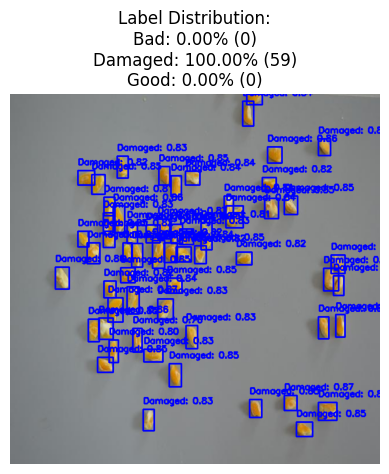

Processing Images:  36%|███▋      | 20/55 [00:21<00:37,  1.06s/it]


0: 640x640 28 Damageds, 248.9ms
Speed: 3.8ms preprocess, 248.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (28)
Good: 0.00% (0)


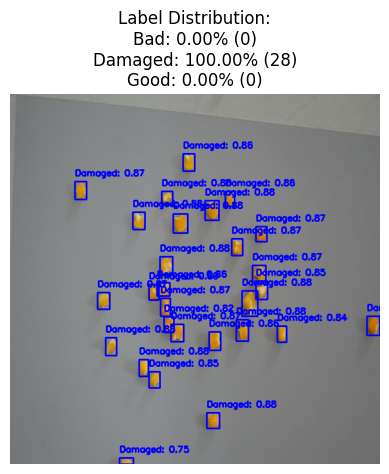

Processing Images:  38%|███▊      | 21/55 [00:22<00:37,  1.09s/it]


0: 640x640 56 Damageds, 240.9ms
Speed: 8.4ms preprocess, 240.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (56)
Good: 0.00% (0)


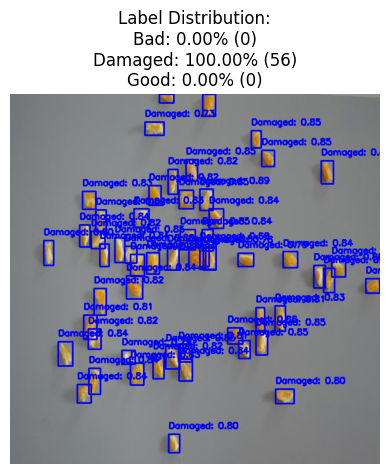

Processing Images:  40%|████      | 22/55 [00:23<00:36,  1.09s/it]


0: 640x640 32 Damageds, 394.2ms
Speed: 4.0ms preprocess, 394.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (32)
Good: 0.00% (0)


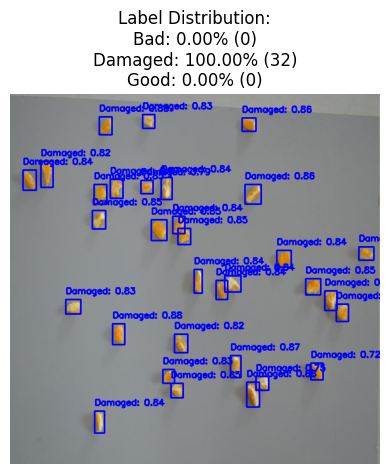

Processing Images:  42%|████▏     | 23/55 [00:25<00:35,  1.11s/it]


0: 640x640 57 Bads, 7 Damageds, 135 Goods, 407.9ms
Speed: 3.7ms preprocess, 407.9ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 28.64% (57)
Damaged: 3.52% (7)
Good: 67.84% (135)


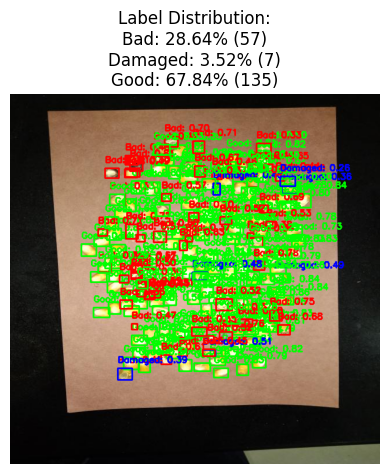

Processing Images:  44%|████▎     | 24/55 [00:26<00:35,  1.15s/it]


0: 640x640 14 Bads, 20 Goods, 404.0ms
Speed: 5.9ms preprocess, 404.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 41.18% (14)
Damaged: 0.00% (0)
Good: 58.82% (20)


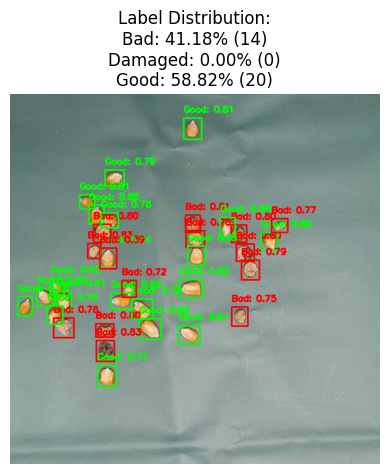

Processing Images:  45%|████▌     | 25/55 [00:27<00:35,  1.19s/it]


0: 640x640 2 Bads, 46 Damageds, 314.8ms
Speed: 3.7ms preprocess, 314.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 4.17% (2)
Damaged: 95.83% (46)
Good: 0.00% (0)


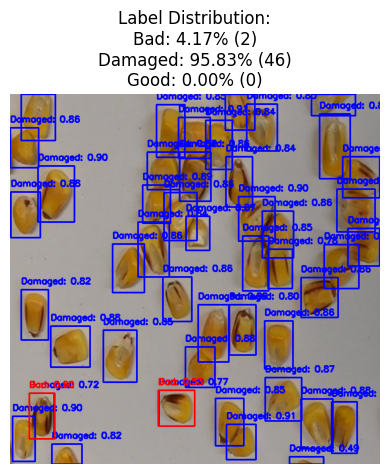

Processing Images:  47%|████▋     | 26/55 [00:28<00:34,  1.17s/it]


0: 640x640 54 Damageds, 237.2ms
Speed: 4.4ms preprocess, 237.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (54)
Good: 0.00% (0)


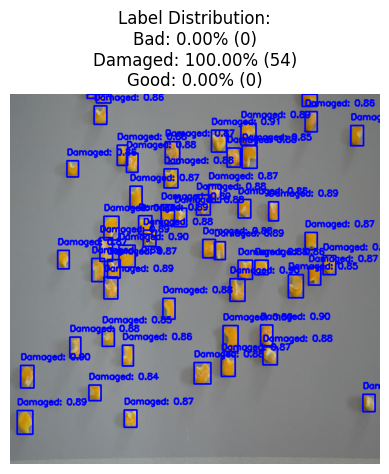

Processing Images:  49%|████▉     | 27/55 [00:29<00:33,  1.21s/it]


0: 640x640 2 Bads, 39 Damageds, 257.4ms
Speed: 4.6ms preprocess, 257.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 4.88% (2)
Damaged: 95.12% (39)
Good: 0.00% (0)


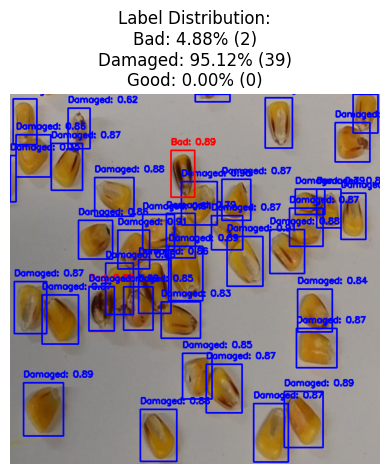

Processing Images:  51%|█████     | 28/55 [00:30<00:30,  1.14s/it]


0: 640x640 55 Bads, 9 Damageds, 129 Goods, 250.2ms
Speed: 5.3ms preprocess, 250.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 28.50% (55)
Damaged: 4.66% (9)
Good: 66.84% (129)


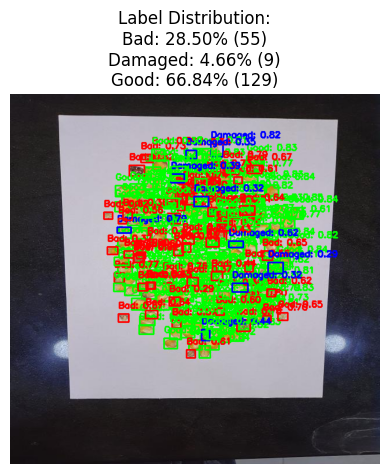

Processing Images:  53%|█████▎    | 29/55 [00:32<00:29,  1.13s/it]


0: 640x640 5 Damageds, 271.8ms
Speed: 5.4ms preprocess, 271.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (5)
Good: 0.00% (0)


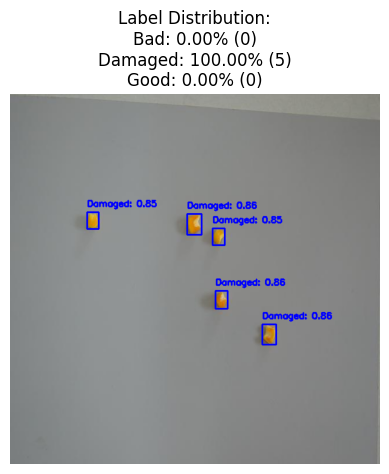

Processing Images:  55%|█████▍    | 30/55 [00:33<00:27,  1.09s/it]


0: 640x640 6 Bads, 11 Goods, 276.1ms
Speed: 7.3ms preprocess, 276.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 35.29% (6)
Damaged: 0.00% (0)
Good: 64.71% (11)


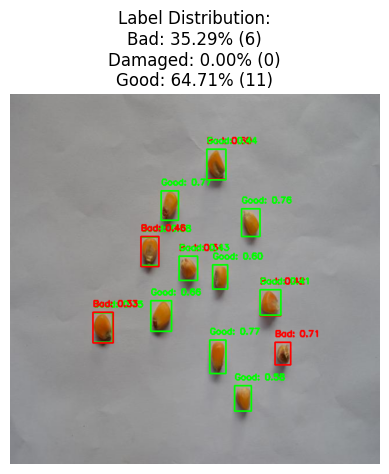

Processing Images:  56%|█████▋    | 31/55 [00:34<00:26,  1.10s/it]


0: 640x640 54 Bads, 13 Damageds, 126 Goods, 270.3ms
Speed: 7.2ms preprocess, 270.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 27.98% (54)
Damaged: 6.74% (13)
Good: 65.28% (126)


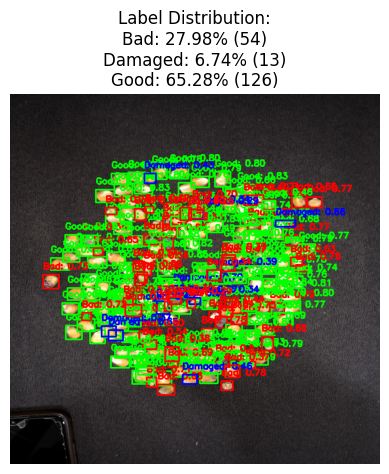

Processing Images:  58%|█████▊    | 32/55 [00:35<00:25,  1.09s/it]


0: 640x640 1 Damaged, 3 Goods, 271.0ms
Speed: 6.9ms preprocess, 271.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 25.00% (1)
Good: 75.00% (3)


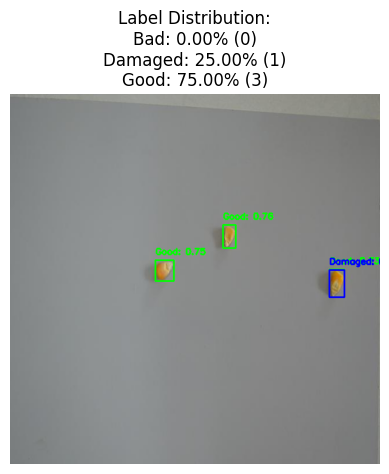

Processing Images:  60%|██████    | 33/55 [00:36<00:23,  1.06s/it]


0: 640x640 67 Damageds, 260.5ms
Speed: 6.6ms preprocess, 260.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (67)
Good: 0.00% (0)


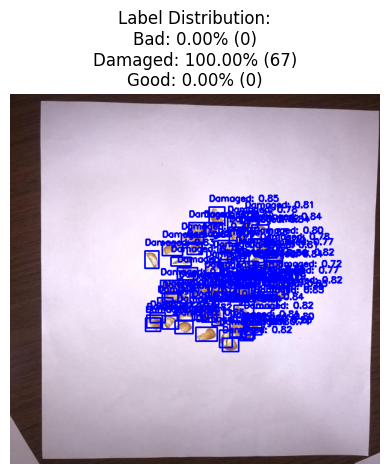

Processing Images:  62%|██████▏   | 34/55 [00:37<00:24,  1.17s/it]


0: 640x640 1 Damaged, 3 Goods, 310.9ms
Speed: 3.5ms preprocess, 310.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 25.00% (1)
Good: 75.00% (3)


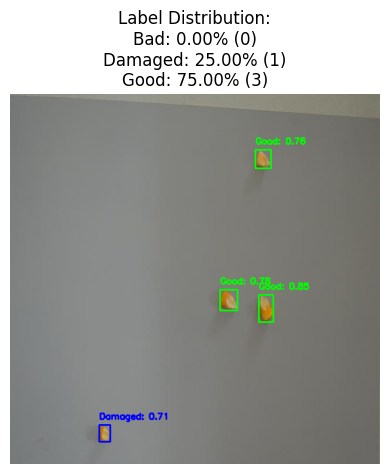

Processing Images:  64%|██████▎   | 35/55 [00:38<00:23,  1.17s/it]


0: 640x640 45 Damageds, 380.2ms
Speed: 3.8ms preprocess, 380.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (45)
Good: 0.00% (0)


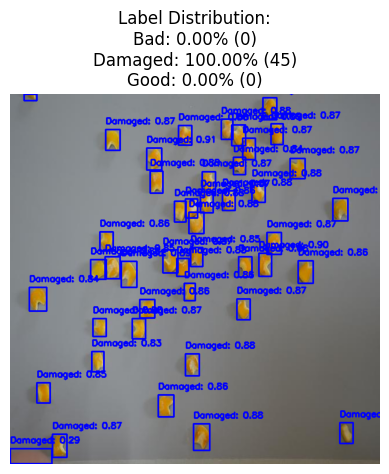

Processing Images:  65%|██████▌   | 36/55 [00:40<00:24,  1.28s/it]


0: 640x640 1 Bad, 42 Damageds, 348.5ms
Speed: 5.4ms preprocess, 348.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 2.33% (1)
Damaged: 97.67% (42)
Good: 0.00% (0)


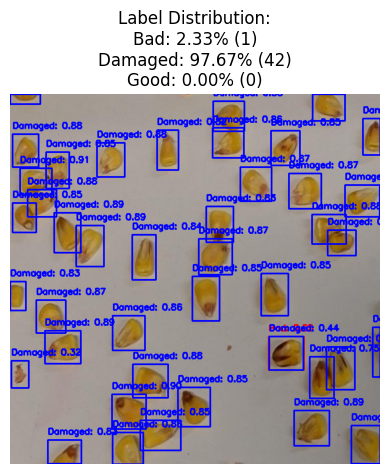

Processing Images:  67%|██████▋   | 37/55 [00:41<00:22,  1.27s/it]


0: 640x640 35 Bads, 86 Goods, 363.3ms
Speed: 3.8ms preprocess, 363.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 28.93% (35)
Damaged: 0.00% (0)
Good: 71.07% (86)


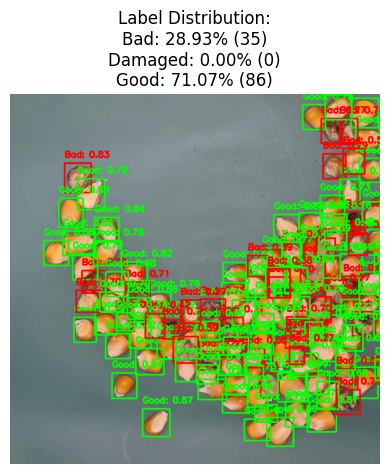

Processing Images:  69%|██████▉   | 38/55 [00:42<00:21,  1.27s/it]


0: 640x640 4 Bads, 36 Damageds, 251.0ms
Speed: 5.7ms preprocess, 251.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 10.00% (4)
Damaged: 90.00% (36)
Good: 0.00% (0)


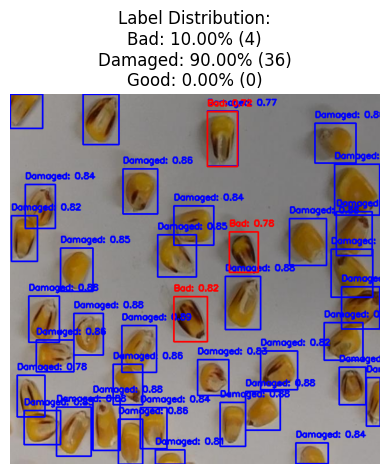

Processing Images:  71%|███████   | 39/55 [00:43<00:19,  1.22s/it]


0: 640x640 40 Damageds, 261.6ms
Speed: 3.7ms preprocess, 261.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (40)
Good: 0.00% (0)


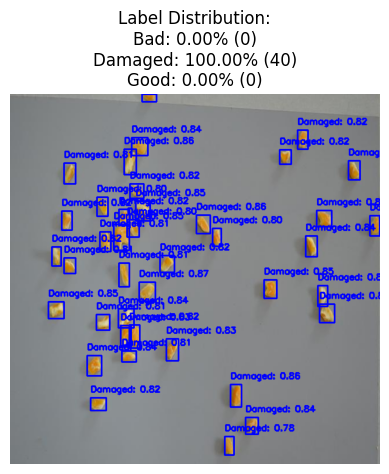

Processing Images:  73%|███████▎  | 40/55 [00:45<00:17,  1.16s/it]


0: 640x640 62 Damageds, 258.6ms
Speed: 8.1ms preprocess, 258.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (62)
Good: 0.00% (0)


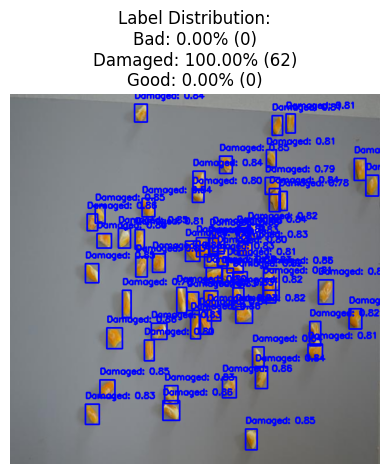

Processing Images:  75%|███████▍  | 41/55 [00:46<00:15,  1.12s/it]


0: 640x640 26 Damageds, 253.3ms
Speed: 4.5ms preprocess, 253.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (26)
Good: 0.00% (0)


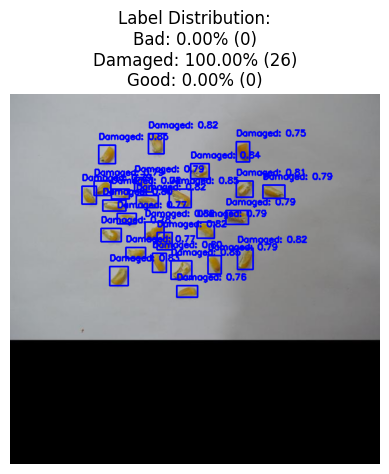

Processing Images:  76%|███████▋  | 42/55 [00:47<00:14,  1.11s/it]


0: 640x640 46 Damageds, 257.5ms
Speed: 5.3ms preprocess, 257.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (46)
Good: 0.00% (0)


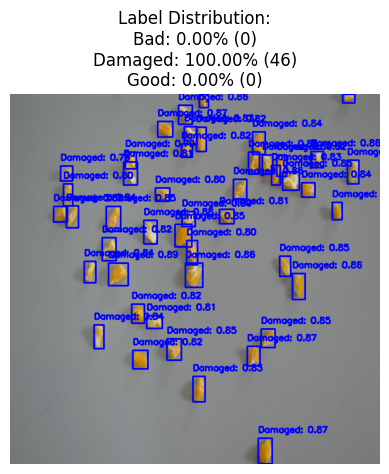

Processing Images:  78%|███████▊  | 43/55 [00:48<00:15,  1.26s/it]


0: 640x640 38 Damageds, 262.0ms
Speed: 3.8ms preprocess, 262.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (38)
Good: 0.00% (0)


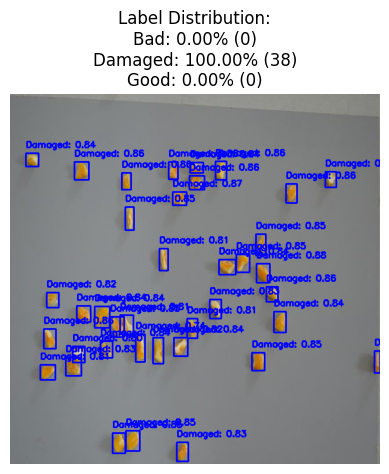

Processing Images:  80%|████████  | 44/55 [00:49<00:13,  1.19s/it]


0: 640x640 55 Bads, 16 Damageds, 122 Goods, 269.1ms
Speed: 3.6ms preprocess, 269.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 28.50% (55)
Damaged: 8.29% (16)
Good: 63.21% (122)


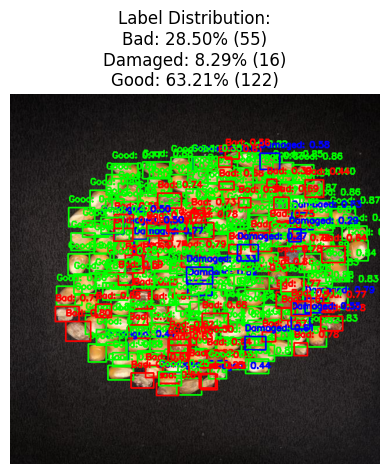

Processing Images:  82%|████████▏ | 45/55 [00:50<00:11,  1.18s/it]


0: 640x640 59 Bads, 8 Damageds, 125 Goods, 277.5ms
Speed: 4.9ms preprocess, 277.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 30.73% (59)
Damaged: 4.17% (8)
Good: 65.10% (125)


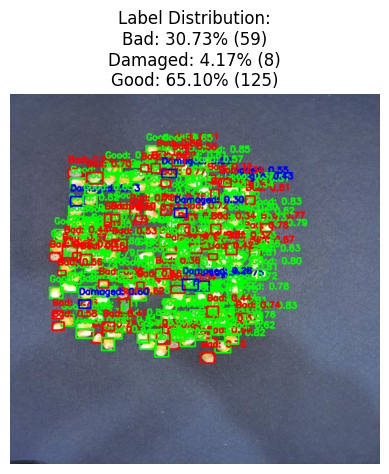

Processing Images:  84%|████████▎ | 46/55 [00:52<00:10,  1.22s/it]


0: 640x640 56 Bads, 6 Damageds, 132 Goods, 380.2ms
Speed: 3.8ms preprocess, 380.2ms inference, 9.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 28.87% (56)
Damaged: 3.09% (6)
Good: 68.04% (132)


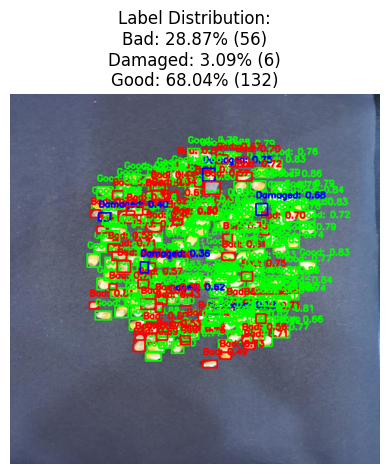

Processing Images:  85%|████████▌ | 47/55 [00:53<00:10,  1.28s/it]


0: 640x640 3 Damageds, 1 Good, 403.4ms
Speed: 3.8ms preprocess, 403.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 75.00% (3)
Good: 25.00% (1)


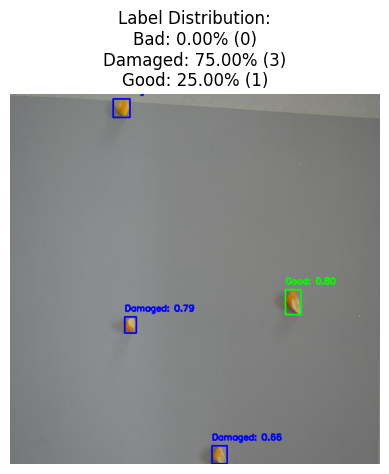

Processing Images:  87%|████████▋ | 48/55 [00:54<00:08,  1.26s/it]


0: 640x640 5 Bads, 13 Damageds, 10 Goods, 400.7ms
Speed: 3.8ms preprocess, 400.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 17.86% (5)
Damaged: 46.43% (13)
Good: 35.71% (10)


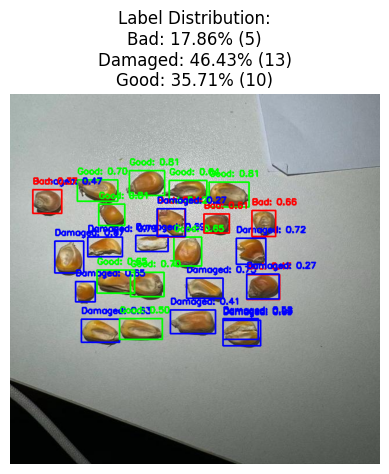

Processing Images:  89%|████████▉ | 49/55 [00:56<00:07,  1.26s/it]


0: 640x640 42 Damageds, 382.4ms
Speed: 3.8ms preprocess, 382.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (42)
Good: 0.00% (0)


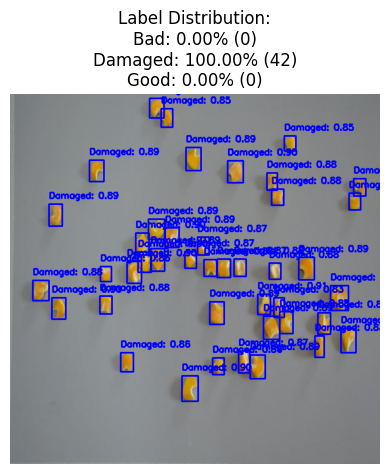

Processing Images:  91%|█████████ | 50/55 [00:57<00:06,  1.36s/it]


0: 640x640 13 Bads, 22 Goods, 278.1ms
Speed: 3.8ms preprocess, 278.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 37.14% (13)
Damaged: 0.00% (0)
Good: 62.86% (22)


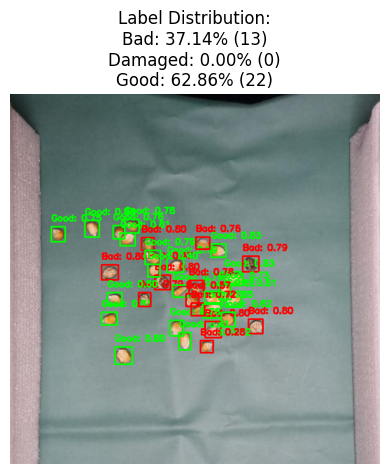

Processing Images:  93%|█████████▎| 51/55 [00:58<00:05,  1.27s/it]


0: 640x640 37 Damageds, 256.3ms
Speed: 4.8ms preprocess, 256.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (37)
Good: 0.00% (0)


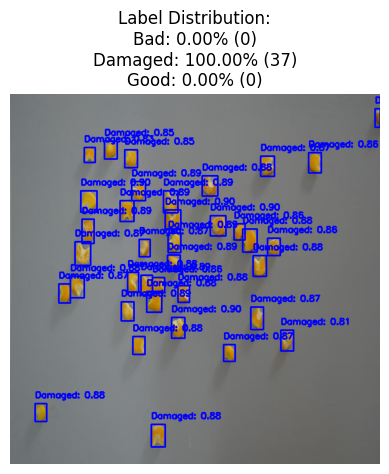

Processing Images:  95%|█████████▍| 52/55 [00:59<00:03,  1.22s/it]


0: 640x640 37 Bads, 267.5ms
Speed: 3.8ms preprocess, 267.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 100.00% (37)
Damaged: 0.00% (0)
Good: 0.00% (0)


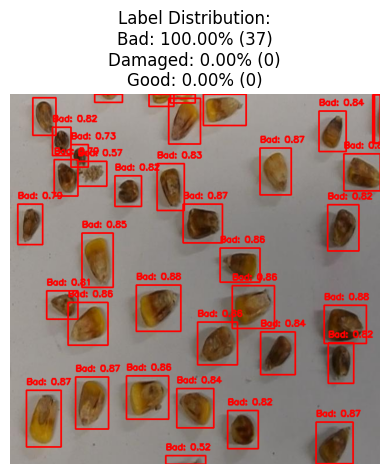

Processing Images:  96%|█████████▋| 53/55 [01:00<00:02,  1.15s/it]


0: 640x640 67 Damageds, 271.7ms
Speed: 3.4ms preprocess, 271.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (67)
Good: 0.00% (0)


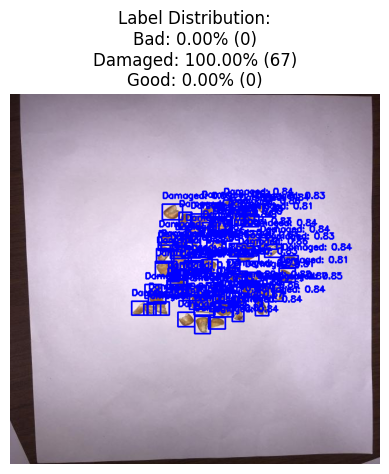

Processing Images:  98%|█████████▊| 54/55 [01:01<00:01,  1.13s/it]


0: 640x640 18 Damageds, 272.4ms
Speed: 4.1ms preprocess, 272.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Label Distribution:
Bad: 0.00% (0)
Damaged: 100.00% (18)
Good: 0.00% (0)


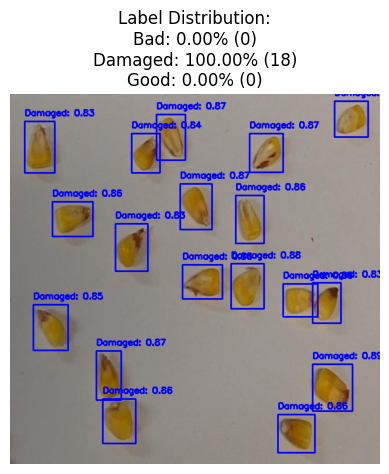

Processing Images: 100%|██████████| 55/55 [01:02<00:00,  1.15s/it]

Processed 55 images and saved results to /content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/results


In [14]:
output_folder = "/content/drive/MyDrive/CORN_MODEL_YOLO/CORN_MODEL_YOLO/results"

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for image_path in tqdm(test_images_filtered, desc="Processing Images"):
    # Run detection and get the annotated image
    annotated_img_with_title = detect_and_report(image_path, model, custom_colors, return_img=True)

    # Get the base filename
    base_filename = os.path.basename(image_path)

    # Create the output path
    output_path = os.path.join(output_folder, base_filename)

    # Save the annotated image
    cv2.imwrite(output_path, annotated_img_with_title)

print(f"Processed {len(test_images_filtered)} images and saved results to {output_folder}")